In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df_gfrac = pd.read_excel("D:/kerja/asisten riset/vol/milkunC/achaidir/IMAGE PBL/SSP2/GFRAC_area_per5years.xlsx")
df_grapc = pd.read_excel("D:/kerja/asisten riset/code v/step 3/GbGlct/dataset/GRAPC_ton.xlsx")
luc_crop = pd.read_excel("D:/kerja/asisten riset/code v/step 3/GbGlct/dataset/luc_agri_prop_crop_AM1_v3.xlsx")
crop_footprint = pd.read_excel("D:/kerja/asisten riset/code v/step 3/GbGlct/dataset/crop_footprint_image_region_v2.xlsx")
intensity_v2 = pd.read_excel("D:/kerja/asisten riset/code v/step 3/GbGlct/dataset/crop_intensity_image_region_v2.xlsx")
country_code = pd.read_excel("D:/kerja/asisten riset/vol/milkunC/achaidir/LUH2 2022/ISO-3166-Country-Code_Final.xlsx")

In [3]:
luc_crop = luc_crop[luc_crop['type'] != "grass"]

In [4]:
crop_footprint_table = crop_footprint.pivot_table(index=['IMAGE Region Name', 'IMAGE Classification'], columns='Year', values='New Value')
crop_footprint_table = crop_footprint_table.reset_index()
crop_footprint_table.head()

Year,IMAGE Region Name,IMAGE Classification,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
0,Brazil,maize,38.536799,16.610154,11.987548,33.888494,91.786378,27.961616,18.805022,1.900236,20.432689,10.535421
1,Brazil,oil & palm fruit,64.596600,7.493856,17.649813,38.936144,97.694342,39.459063,28.747249,0.562381,21.365624,5.493772
2,Brazil,other non-food & luxury & spices,41.373518,17.540857,13.222502,27.274402,83.931423,22.526992,0.000000,0.008766,6.089085,4.074654
3,Brazil,other temperate cereals,98.809654,34.998916,22.275022,44.714230,123.053162,34.641124,23.332857,1.809258,22.616980,5.316782
4,Brazil,plant based fibres,48.783709,23.041765,14.616056,27.966820,82.346294,21.304169,12.381535,0.000000,16.402463,3.668680


In [5]:
intensity_v2_table = intensity_v2.pivot_table(index=['IMAGE Region Name', 'IMAGE Classification'], columns='Year', values='New Value')
intensity_v2_table = intensity_v2_table.reset_index()
intensity_v2_table.head()

Year,IMAGE Region Name,IMAGE Classification,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
0,Brazil,maize,25.000834,10.342402,6.636934,17.081608,36.452047,9.455210,5.411197,0.444169,3.936610,1.996079
1,Brazil,"oil, palm fruit",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Brazil,"other non-food, luxury, spices",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,Brazil,other temperate cereals,96.736597,35.414370,18.095732,38.158666,97.015487,23.550994,13.584310,0.816831,10.430253,2.256360
4,Brazil,plant-based fibers,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [6]:
df_gfrac = df_gfrac[df_gfrac['type'] != "grass"]
df_gfrac['type'].unique()

array(['Wheat', 'Rice', 'Maize', 'Tropical cereals',
       'Other temperate cereals', 'Pulses', 'Soybeans',
       'Temperate oil crops', 'Tropical oil crops',
       'Temperate roots & tubers', 'Tropical roots & tubers',
       'Sugar crops', 'Oil & palm fruit', 'Vegetables & fruits',
       'Other non-food & luxury & spices', 'Plant based fibres'],
      dtype=object)

In [7]:
df_gfrac_merge = pd.merge(left=df_gfrac, right=country_code, left_on="country", right_on="ISO Country")
df_grapc_merge = pd.merge(left=df_grapc, right=country_code, left_on="country", right_on="ISO Country")
luc_crop_merge = pd.merge(left=luc_crop, right=country_code, left_on="country_name", right_on="ISO Country")

In [8]:
df_gfrac_merge = df_gfrac_merge[['IMAGE Region Name', 'type', 1975,
                      1980,                1985,                1990,
                      1995,                2000,                2005,
                      2010,                2015,                2020]]

df_grapc_merge = df_grapc_merge[['IMAGE Region Name', 'type',                1975,
                      1980,                1985,                1990,
                      1995,                2000,                2005,
                      2010,                2015,                2020]]

luc_crop_merge = luc_crop_merge[['IMAGE Region Name', 'type',                1975,
                      1980,                1985,                1990,
                      1995,                2000,                2005,
                      2010,                2015,                2020]]

In [9]:
df_gfrac_groupby = df_gfrac_merge.groupby(['IMAGE Region Name', 'type']).sum()
df_gfrac_index = df_gfrac_groupby.reset_index()

df_grapc_groupby = df_grapc_merge.groupby(['IMAGE Region Name', 'type']).sum()
df_grapc_index = df_grapc_groupby.reset_index()

luc_crop_groupby = luc_crop_merge.groupby(['IMAGE Region Name', 'type']).sum()
luc_crop_index = luc_crop_groupby.reset_index()

crop_footprint_groupby = crop_footprint_table.groupby(['IMAGE Region Name', 'IMAGE Classification']).sum()
crop_footprint_index = crop_footprint_groupby.reset_index()

intensity_v2_groupby = intensity_v2_table.groupby(['IMAGE Region Name', 'IMAGE Classification']).sum()
intensity_v2_index = intensity_v2_groupby.reset_index()

In [10]:
df_gfrac_copy = df_gfrac_index.copy()
for year in range(1975, 2025, 5):
    last_year = year - 5
    if year > 1975:
        df_gfrac_copy[year] = ((df_gfrac_index[year] - df_gfrac_index[last_year]) / df_gfrac_index[last_year]) * 100
        df_gfrac_copy[year] = df_gfrac_copy[year].replace([np.inf, -np.inf], np.nan)
        df_gfrac_copy[year] = df_gfrac_copy[year].fillna(0)
    else:
        df_gfrac_copy[year] = 0 
df_gfrac_copy.index = df_gfrac_copy['IMAGE Region Name']
df_gfrac_copy["type"] = [x.lower() for x in df_gfrac_copy["type"]]
df_gfrac_copy.head()

,IMAGE Region Name,type,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
IMAGE Region Name,,,,,,,,,,,,
Brazil,Brazil,maize,0,3.042193,3.158016,8.505226,19.404730,-7.816938,1.699159,4.451508,9.556419,1.297085
Brazil,Brazil,oil & palm fruit,0,70.673671,87.891070,261.772685,84.700411,13.886609,7.385760,11.709612,22.582274,3.612878
Brazil,Brazil,other non-food & luxury & spices,0,15.107767,10.692307,12.094639,-3.135584,10.226266,-0.867295,-7.396325,-6.525252,0.280640
Brazil,Brazil,other temperate cereals,0,34.396466,8.557389,26.152013,17.660070,16.601335,-2.095566,-41.135050,24.831146,0.659611
Brazil,Brazil,plant based fibres,0,-7.503749,-18.713809,-27.235356,-42.661710,-11.234904,22.290767,2.977463,-16.368940,2.846153


In [11]:
df_grapc_copy = df_grapc_index.copy()
for year in range(1975, 2025, 5):
    last_year = year - 5
    if year > 1975:
        df_grapc_copy[year] = ((df_grapc_index[year] - df_grapc_index[last_year]) / df_grapc_index[last_year]) * 100
        df_grapc_copy[year] = df_grapc_copy[year].replace([np.inf, -np.inf], np.nan)
        df_grapc_copy[year] = df_grapc_copy[year].fillna(0)
    else:
        df_grapc_copy[year] = 0

df_grapc_copy.index = df_grapc_copy['IMAGE Region Name']
df_grapc_copy["type"] = [x.lower() for x in df_grapc_copy["type"]]
df_grapc_copy.head()

,IMAGE Region Name,type,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
IMAGE Region Name,,,,,,,,,,,,
Brazil,Brazil,maize,0,7.963767,13.692905,7.540424,9.002827,16.052436,25.884621,26.875998,20.025028,6.094794
Brazil,Brazil,oil & palm fruit,0,6.001348,3.762308,-19.343761,-4.357522,-10.958993,31.196158,7.248098,4.567091,5.586250
Brazil,Brazil,other non-food & luxury & spices,0,15.761347,8.170418,-15.892668,0.069539,28.021098,17.457805,20.294558,11.993523,3.609855
Brazil,Brazil,other temperate cereals,0,-7.606853,10.625019,-6.639198,-9.445955,7.663838,17.163125,31.527173,7.798344,7.590755
Brazil,Brazil,plant based fibres,0,0.751751,47.097798,30.583312,1.936751,76.834216,36.780983,11.371321,9.924063,8.823484


In [12]:
luc_crop_copy = luc_crop_index.copy()
for year in range(1975, 2025, 5):
    last_year = year - 5
    if year > 1975:
        luc_crop_copy[year] = ((luc_crop_index[year] - luc_crop_index[last_year]) / luc_crop_index[last_year]) * 100
        luc_crop_copy[year] = luc_crop_copy[year].replace([np.inf, -np.inf], np.nan)
        luc_crop_copy[year] = luc_crop_copy[year].fillna(0)
    else:
        luc_crop_copy[year] = 0

luc_crop_copy.index = luc_crop_copy['IMAGE Region Name']
luc_crop_copy.head()

,IMAGE Region Name,type,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
IMAGE Region Name,,,,,,,,,,,,
Brazil,Brazil,maize,0,-53.988946,-24.786419,198.777290,171.611562,-72.349227,-26.825710,-89.114633,1138.020492,-39.634932
Brazil,Brazil,oil & palm fruit,0,-79.202339,346.542178,670.929292,292.241442,-54.730206,-16.584679,-97.721320,4339.244122,-61.451058
Brazil,Brazil,other non-food & luxury & spices,0,-49.253423,-14.766715,126.827189,150.171018,-70.922741,-100.000000,0.000000,65559.513216,-37.589475
Brazil,Brazil,other temperate cereals,0,-35.051013,-26.405901,172.330695,167.265838,-66.027689,-15.456241,-94.818647,1537.029678,-65.637147
Brazil,Brazil,plant based fibres,0,-54.776723,-47.936186,35.998465,42.831776,-77.292835,-24.260166,-100.000000,0.000000,-69.901862


In [105]:
luc_crop_copy.shape

(442, 12)

In [13]:
crop_footprint_copy = crop_footprint_index.copy()
for year in range(1975, 2025, 5):
    last_year = year - 5
    if year > 1975:
        crop_footprint_copy[year] = ((crop_footprint_index[year] - crop_footprint_index[last_year]) / crop_footprint_index[last_year]) * 100
        crop_footprint_copy[year] = crop_footprint_copy[year].replace([np.inf, -np.inf], np.nan)
        crop_footprint_copy[year] = crop_footprint_copy[year].fillna(0)
    else:
        crop_footprint_copy[year] = 0

crop_footprint_copy.index = crop_footprint_copy['IMAGE Region Name']
crop_footprint_copy.head()

Year,IMAGE Region Name,IMAGE Classification,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
IMAGE Region Name,,,,,,,,,,,,
Brazil,Brazil,maize,0,-56.897939,-27.830003,182.697462,170.848209,-69.536203,-32.747012,-89.895060,975.271059,-48.438403
Brazil,Brazil,oil & palm fruit,0,-88.398993,135.523770,120.603720,150.909138,-59.609675,-27.146650,-98.043706,3699.138530,-74.286862
Brazil,Brazil,other non-food & luxury & spices,0,-57.603661,-24.618834,106.272623,207.729652,-73.160240,-100.000000,0.000000,69365.170516,-33.082660
Brazil,Brazil,other temperate cereals,0,-64.579456,-36.355110,100.737085,175.199112,-71.848652,-32.644055,-92.245880,1150.069563,-76.492076
Brazil,Brazil,plant based fibres,0,-52.767502,-36.567117,91.343143,194.442820,-74.128564,-41.882101,-100.000000,0.000000,-77.633361


In [107]:
crop_footprint_copy.shape

(389, 12)

In [14]:
intensity_v2_copy = intensity_v2_index.copy()
for year in range(1975, 2025, 5):
    last_year = year - 5
    if year > 1975:
        intensity_v2_copy[year] = ((intensity_v2_index[year] - intensity_v2_index[last_year]) / intensity_v2_index[last_year]) * 100
        intensity_v2_copy[year] = intensity_v2_copy[year].replace([np.inf, -np.inf], np.nan)
        intensity_v2_copy[year] = intensity_v2_copy[year].fillna(0)
    else:
        intensity_v2_copy[year] = 0

intensity_v2_copy.index = intensity_v2_copy['IMAGE Region Name']
intensity_v2_copy['IMAGE Classification'] = intensity_v2_copy['IMAGE Classification'].apply(lambda x: x.replace('and', '&').replace('plant-based fibers', 'plant based fibres').replace('oil, palm fruit', 'oil & palm fruit').replace('other non-food, luxury, spices', 'other non-food & luxury & spices').replace('vegetables or fruits', 'vegetables & fruits'))
intensity_v2_copy.head()

Year,IMAGE Region Name,IMAGE Classification,1975,1980,1985,1990,1995,2000,2005,2010,2015,2020
IMAGE Region Name,,,,,,,,,,,,
Brazil,Brazil,maize,0,-58.631773,-35.827919,157.371959,113.399385,-74.061237,-42.770206,-91.791677,786.287540,-49.294479
Brazil,Brazil,oil & palm fruit,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Brazil,Brazil,other non-food & luxury & spices,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Brazil,Brazil,other temperate cereals,0,-63.390928,-48.902856,110.871086,154.242346,-75.724501,-42.319589,-93.986953,1176.917031,-78.367161
Brazil,Brazil,plant based fibres,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


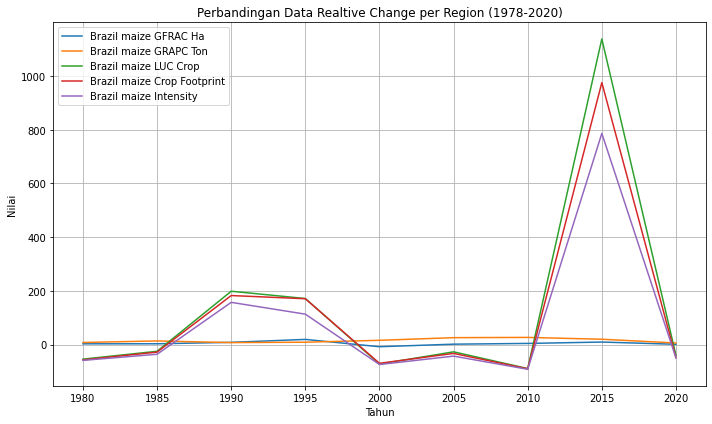

In [16]:
tahun = np.array([list(range(1980, 2025, 5))])
plt.figure(figsize=(10, 6))
plt.plot(tahun[0], df_gfrac_copy[df_gfrac_copy['type'] == "maize"].loc["Brazil", tahun[0]].values, label=f'{"Brazil"} {"maize"} GFRAC Ha')
plt.plot(tahun[0], df_grapc_copy[df_grapc_copy['type'] == "maize"].loc["Brazil", tahun[0]].values, label=f'{"Brazil"} {"maize"} GRAPC Ton')
plt.plot(tahun[0], luc_crop_copy[luc_crop_copy['type'] == "maize"].loc["Brazil", tahun[0]].values, label=f'{"Brazil"} {"maize"} LUC Crop')
plt.plot(tahun[0], crop_footprint_copy[crop_footprint_copy['IMAGE Classification'] == "maize"].loc["Brazil", tahun[0]].values, label=f'{"Brazil"} {"maize"} Crop Footprint')
plt.plot(tahun[0], intensity_v2_copy[intensity_v2_copy['IMAGE Classification'] == "maize"].loc["Brazil", tahun[0]].values, label=f'{"Brazil"} {"maize"} Intensity')
plt.xlabel('Tahun')
plt.ylabel('Nilai')
plt.title('Perbandingan Data Realtive Change per Region (1978-2020)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

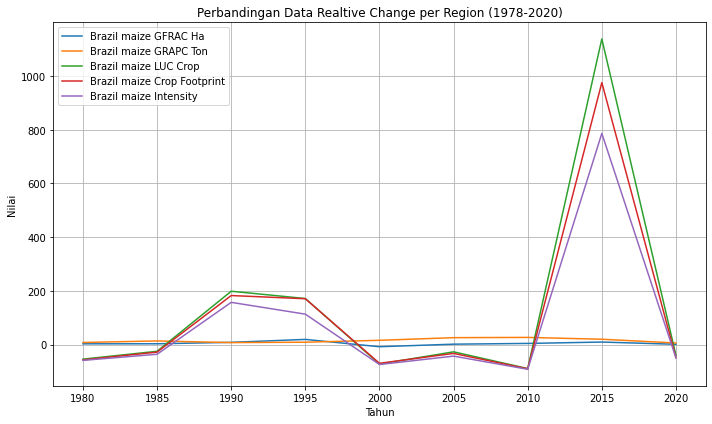

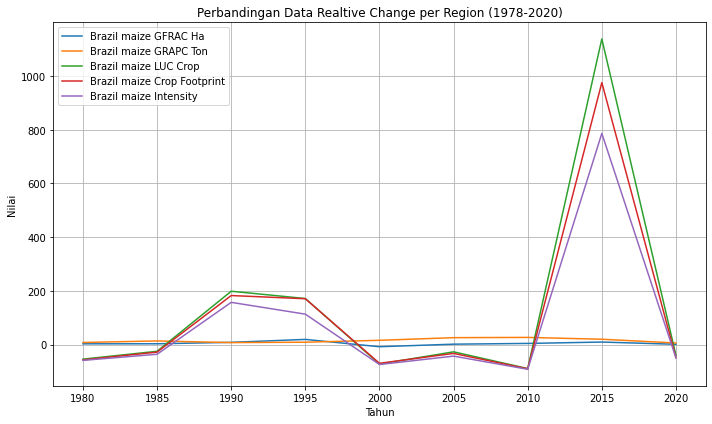

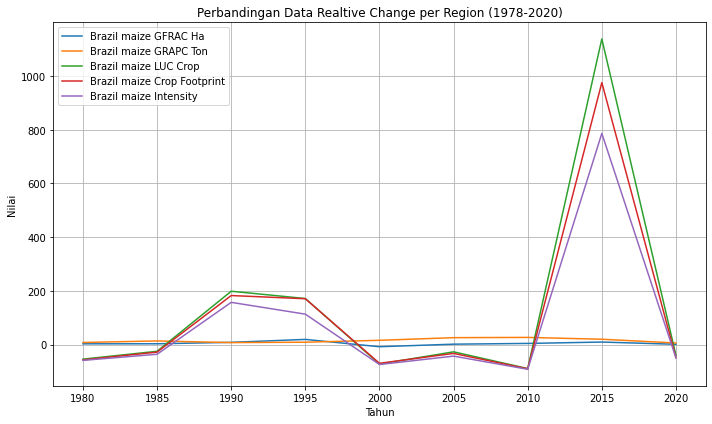

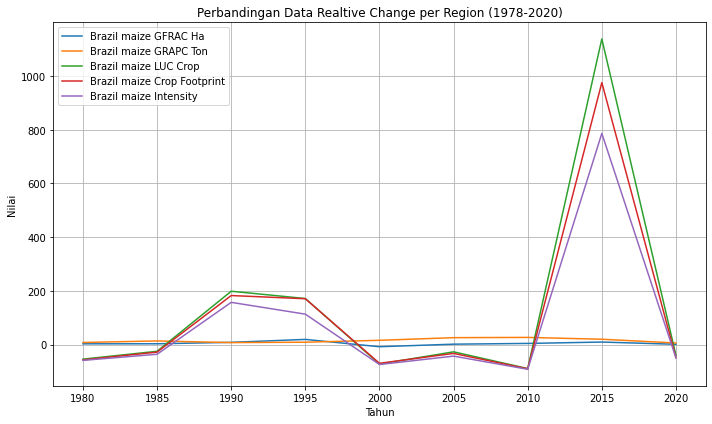

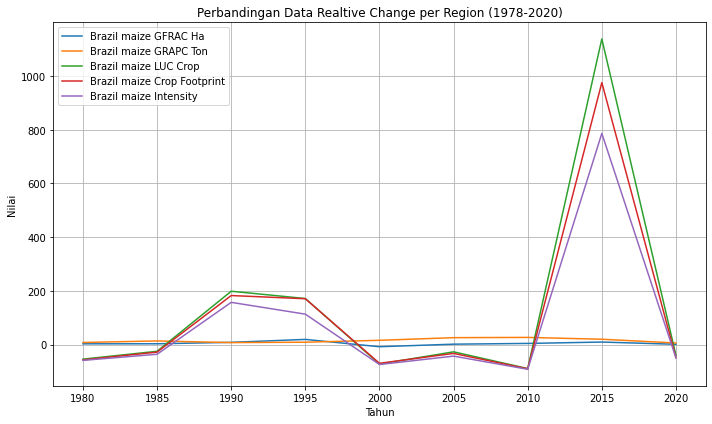

...

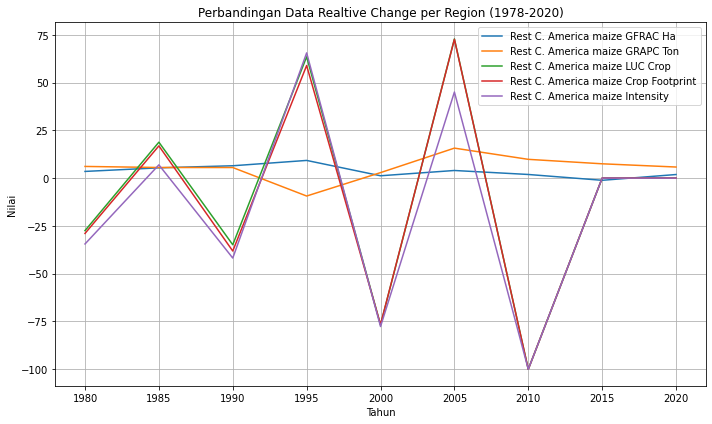

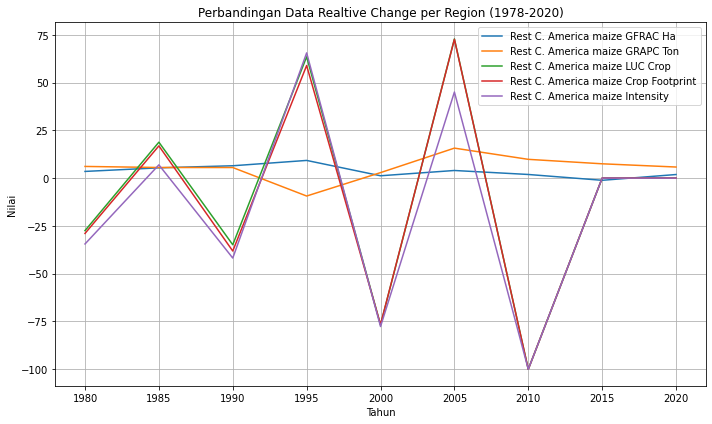

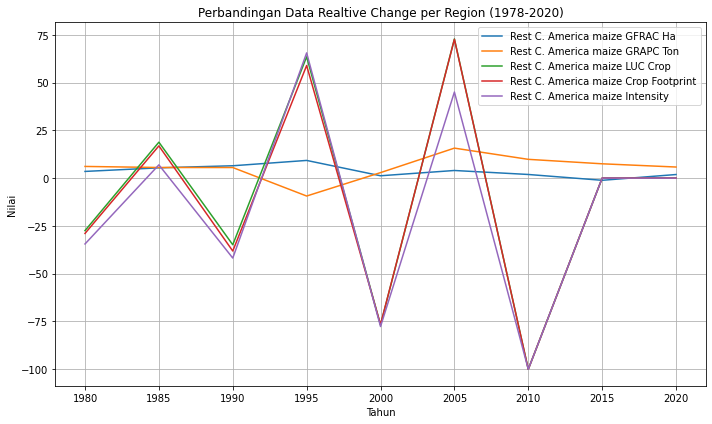

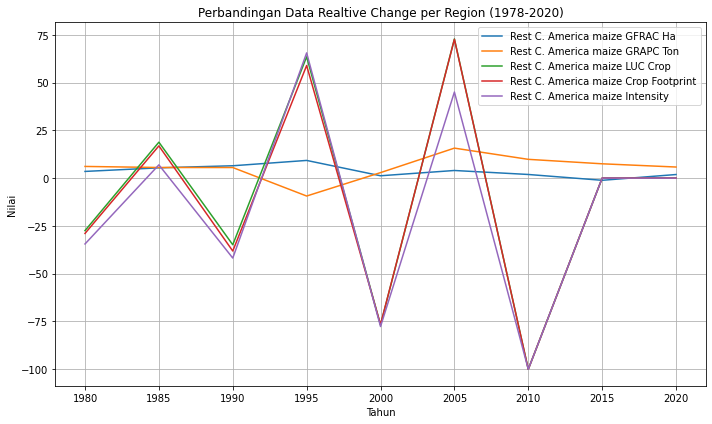

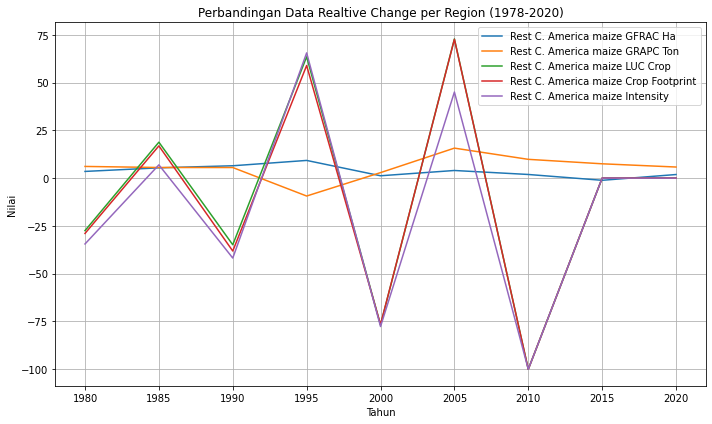

In [30]:
tahun = np.array([list(range(1980, 2025, 5))])

for ngfbfc in df_gfrac_copy['type'].unique():
    for region in df_gfrac_copy['IMAGE Region Name'].to_list():
        try:
            plt.figure(figsize=(10, 6))
            plt.plot(tahun[0], df_gfrac_copy[df_gfrac_copy['type'] == ngfbfc].loc[region, tahun[0]].values, label=f'{region} {ngfbfc} GFRAC Ha')
            plt.plot(tahun[0], df_grapc_copy[df_grapc_copy['type'] == ngfbfc].loc[region, tahun[0]].values, label=f'{region} {ngfbfc} GRAPC Ton')
            plt.plot(tahun[0], luc_crop_copy[luc_crop_copy['type'] == ngfbfc].loc[region, tahun[0]].values, label=f'{region} {ngfbfc} LUC Crop')
            plt.plot(tahun[0], crop_footprint_copy[crop_footprint_copy['IMAGE Classification'] == ngfbfc].loc[region, tahun[0]].values, label=f'{region} {ngfbfc} Crop Footprint')
            plt.plot(tahun[0], intensity_v2_copy[intensity_v2_copy['IMAGE Classification'] == ngfbfc].loc[region, tahun[0]].values, label=f'{region} {ngfbfc} Intensity')
            plt.xlabel('Tahun')
            plt.ylabel('Nilai')
            plt.title('Perbandingan Data Realtive Change per Region (1978-2020)')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
        except:
            print(region, ngfbfc)